---
* **Universidad:** UOC (Universitat Oberta de Catalunya)
* **Titulación:** Master Ciencia de Datos/TFM
* **Título:** Segmentación de imágenes utilizando Redes Generativas Antagónicas
* **Actividad**: Generación modelo de segmentacion de armas cortas.
* **Autor:** Miguel Ponce
* **Correo:** miguelalejoponce@uoc.edu
* **Fecha:** "Enero, 03 de 2023"
* **Salida**: ipynb
---
## Contexto: Detección de personas

* **Contexto:**
Modelo para la segementación de armas y obtención de la firgura del objeto.

* **Problema:** 
Existen diferentes conjuntos de datos disponibles sin embargo se hace uso del conjunto de datos que corresponde al grupo procesado de personas con armas cortas.

* **Solucion :** 
Se utilizara el trabajo realizado en https://github.com/idealo/image-super-resolution#additional-information, con redes GAN.
* **Entorno:** con GPU.
  

## Origen del la fuente de datos
@misc{ guns-segmentation_dataset,
    title = { Guns Segmentation Dataset },
    type = { Open Source Dataset },
    author = { Miguel Alejandro Ponce Proaño },
    howpublished = { \url{ https://universe.roboflow.com/miguel-alejandro-ponce-proano/guns-segmentation } },
    url = { https://universe.roboflow.com/miguel-alejandro-ponce-proano/guns-segmentation },
    journal = { Roboflow Universe },
    publisher = { Roboflow },
    year = { 2022 },
    month = { dec },
    note = { visited on 2023-01-03 },
}

## Instalar requisitos

_(Recuerde elegir GPU en tiempo de ejecución si aún no lo ha seleccionado. Tiempo de ejecución --> Cambiar tipo de tiempo de ejecución --> Acelerador de hardware --> GPU)_

In [1]:
!python -m pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached PyYAML-5.1-cp38-cp38-linux_x86_64.whl
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
roboflow 0.2.22 requires PyYAML>=5.3.1, but you have pyyaml 5.1 which is incompatible.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
fatal: destination path 'detectron2' already exists and is not an empty directory.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Importar Librerias

In [3]:
from roboflow import Roboflow
import torch, detectron2
import glob
import matplotlib.pyplot as plt
from PIL import Image
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
# import some common detectron2 utilities
import logging
import torch
from collections import OrderedDict
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.solver import build_lr_scheduler, build_optimizer
from detectron2.checkpoint import DetectionCheckpointer, PeriodicCheckpointer
from detectron2.utils.events import EventStorage
from detectron2.modeling import build_model
import detectron2.utils.comm as comm
from detectron2.engine import default_argument_parser, default_setup, default_writers, launch
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    inference_on_dataset,
    print_csv_format,
)
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

## Mostrar caracteristicas del entorno

In [4]:
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


## Descarga conjunto de datos

In [5]:
VERSION = 1
rf = Roboflow(api_key="3rOW8xY5g1wv0JEQF2Vl")
project = rf.workspace("miguel-alejandro-ponce-proano").project("guns-segmentation")
dataset = project.version(VERSION).download("coco")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Guns-Segmentation-1 in coco:: 100%|██████████| 1478/1478 [00:01<00:00, 796.98it/s] 


# Train on a custom dataset

En esta sección, se muestra cómo entrenar un modelo con detectron2 en un conjunto de datos personalizado con formato COCO.

Tener en cuenta que el conjunto de datos COCO tiene la categoría "gun". Con esta herramienta podremos reconocer esta nueva clase en unos minutos.



## Preparación del conjunto de datos

In [6]:
dataset_path = "{fpath}-{fversion}".format(fpath="Guns-Segmentation",fversion=VERSION)
dataset_path

'Guns-Segmentation-1'

In [7]:
DatasetCatalog.clear()
register_coco_instances("asl_poly_train", {}, f"./{dataset_path}/train/_annotations.coco.json", f"./{dataset_path}/train/")
register_coco_instances("asl_poly_valid", {}, f"./{dataset_path}/valid/_annotations.coco.json", f"./{dataset_path}/valid/")
register_coco_instances("asl_poly_test", {}, f"./{dataset_path}/test/_annotations.coco.json", f"./{dataset_path}/test/")


## Visualizar algunos ejemplos de conjunjunto de datos
Para verificar que el conjunto de datos tenga el formato correcto, visualizaremos las anotaciones de algunas muestras seleccionadas aleatoriamente:


WARNING [01/03 20:00:37 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 20:00:37 d2.data.datasets.coco]: Loaded 1245 images in COCO format from ./Guns-Segmentation-1/train/_annotations.coco.json


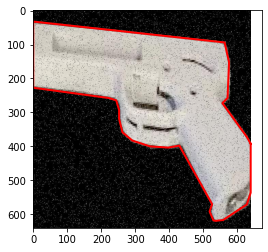

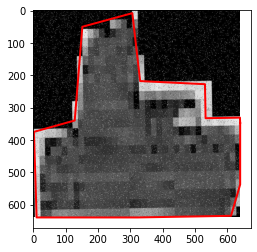

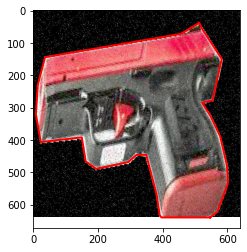

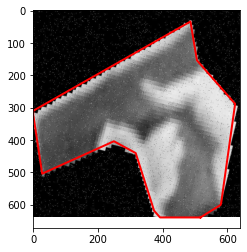

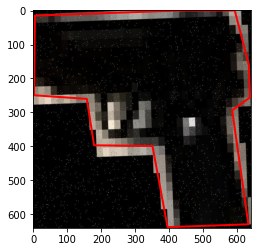

In [8]:
dataset_train = DatasetCatalog.get("asl_poly_train")
for dataset_dict in  random.sample(dataset_train,5):
  fig, ax = plt.subplots()
  dataset_dict = random.choice(dataset_train)
  im = Image.open(dataset_dict['file_name'])
  ax.imshow(im)
  for ann in dataset_dict['annotations']:
      for poly in ann['segmentation']:
          x = poly[0::2]
          y = poly[1::2]
          ax.plot(x,y, linewidth=2, color='red')


## Entrenamiento(Train)

Ahora, utilizamos un modelo de detección de objectos faster_rcnn_X_101_32x8d_FPN_3x previamente entrenado por COCO. Se necesitan varios minutos para entrenar 300 iteraciones con una GPU.

In [9]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("asl_poly_train",)#Train dataset registered in a previous cell
cfg.DATASETS.TEST = ("asl_poly_test",)#Test dataset registered in a previous cell
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00055
cfg.SOLVER.MAX_ITER = 1200 
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # 26 letters plus one super class
cfg.TEST.EVAL_PERIOD = 0 # Increase this number if you want to monitor validation performance during training

PATIENCE = 500 #Early stopping will occur after N iterations of no imporovement in total_loss

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [10]:
def get_evaluator(cfg, dataset_name, output_folder=None):
    """
    Create evaluator(s) for a given dataset.
    This uses the special metadata "evaluator_type" associated with each builtin dataset.
    For your own dataset, you can simply create an evaluator manually in your
    script and do not have to worry about the hacky if-else logic here.
    """
    if output_folder is None:
        output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
    evaluator_list = []
    evaluator_type = MetadataCatalog.get(dataset_name).evaluator_type
    if evaluator_type in ["sem_seg", "coco_panoptic_seg"]:
        evaluator_list.append(
            SemSegEvaluator(
                dataset_name,
                distributed=True,
                output_dir=output_folder,
            )
        )
    if evaluator_type in ["coco", "coco_panoptic_seg"]:
        evaluator_list.append(COCOEvaluator(dataset_name, output_dir=output_folder))
    if evaluator_type == "coco_panoptic_seg":
        evaluator_list.append(COCOPanopticEvaluator(dataset_name, output_folder))
    if evaluator_type == "cityscapes_instance":
        return CityscapesInstanceEvaluator(dataset_name)
    if evaluator_type == "cityscapes_sem_seg":
        return CityscapesSemSegEvaluator(dataset_name)
    if evaluator_type == "pascal_voc":
        return PascalVOCDetectionEvaluator(dataset_name)
    if evaluator_type == "lvis":
        return LVISEvaluator(dataset_name, cfg, True, output_folder)
    if len(evaluator_list) == 0:
        raise NotImplementedError(
            "no Evaluator for the dataset {} with the type {}".format(dataset_name, evaluator_type)
        )
    if len(evaluator_list) == 1:
        return evaluator_list[0]
    return DatasetEvaluators(evaluator_list)

def do_test(cfg, model):
    results = OrderedDict()
    for dataset_name in cfg.DATASETS.TEST:
        data_loader = build_detection_test_loader(cfg, dataset_name)
        evaluator = get_evaluator(
            cfg, dataset_name, os.path.join(cfg.OUTPUT_DIR, "inference", dataset_name)
        )
        results_i = inference_on_dataset(model, data_loader, evaluator)
        results[dataset_name] = results_i
        if comm.is_main_process():
            logger.info("Evaluation results for {} in csv format:".format(dataset_name))
            print_csv_format(results_i)
    if len(results) == 1:
        results = list(results.values())[0]
    return results


logger = logging.getLogger("detectron2")
resume=False
model = build_model(cfg)
optimizer = build_optimizer(cfg, model)
scheduler = build_lr_scheduler(cfg, optimizer)

BEST_LOSS = np.inf

checkpointer = DetectionCheckpointer(
    model, cfg.OUTPUT_DIR, optimizer=optimizer, scheduler=scheduler
)
start_iter = (
    checkpointer.resume_or_load(cfg.MODEL.WEIGHTS, resume=resume).get("iteration", -1) + 1
)
prev_iter = start_iter
max_iter = cfg.SOLVER.MAX_ITER

periodic_checkpointer = PeriodicCheckpointer(
    checkpointer, cfg.SOLVER.CHECKPOINT_PERIOD, max_iter=max_iter
)

writers = default_writers(cfg.OUTPUT_DIR, max_iter) if comm.is_main_process() else []

# compared to "train_net.py", we do not support accurate timing and
# precise BN here, because they are not trivial to implement in a small training loop
data_loader = build_detection_train_loader(cfg)
logger.info("Starting training from iteration {}".format(start_iter))
patience_counter = 0
with EventStorage(start_iter) as storage:
    for data, iteration in zip(data_loader, range(start_iter, max_iter)):
        storage.iter = iteration

        loss_dict = model(data)
        losses = sum(loss_dict.values())
        assert torch.isfinite(losses).all(), loss_dict

        loss_dict_reduced = {k: v.item() for k, v in comm.reduce_dict(loss_dict).items()}
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())
        if comm.is_main_process():
            storage.put_scalars(total_loss=losses_reduced, **loss_dict_reduced)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        storage.put_scalar("lr", optimizer.param_groups[0]["lr"], smoothing_hint=False)
        scheduler.step()

        if (
            cfg.TEST.EVAL_PERIOD > 0
            and (iteration + 1) % cfg.TEST.EVAL_PERIOD == 0
            and iteration != max_iter - 1
        ):
            do_test(cfg, model)
            # Compared to "train_net.py", the test results are not dumped to EventStorage
            comm.synchronize()

        if iteration - start_iter > 5 and (
            (iteration + 1) % 20 == 0 or iteration == max_iter - 1
        ):
            for writer in writers:
                writer.write()
        periodic_checkpointer.step(iteration)
        
        if iteration > prev_iter:
            prev_iter = iteration
            if losses_reduced < BEST_LOSS:
                BEST_LOSS = losses_reduced
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter % 100 == 0:
                    print(f"Loss has not improved for {patience_counter} iterations")
                if patience_counter >= PATIENCE:
                    print(f"EARLY STOPPING")
                    break
                
do_test(cfg, model)

[01/03 20:00:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


WARNING [01/03 20:00:43 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 20:00:43 d2.data.datasets.coco]: Loaded 1245 images in COCO format from ./Guns-Segmentation-1/train/_annotations.coco.json
[01/03 20:00:43 d2.data.build]: Removed 0 images with no usable annotations. 1245 images left.
[01/03 20:00:44 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|    guns    | 0            |    gun     | 1245         |
|            |              |            |              |
|   total    | 1245         |            |              |
[01/03 20:00:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[01/03 20:00:44 d2.data.build]: Using training sample

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)


[01/03 20:00:53 d2.utils.events]:  iter: 19  total_loss: 2.027  loss_cls: 1.245  loss_box_reg: 0.07098  loss_mask: 0.6874  loss_rpn_cls: 0.004349  loss_rpn_loc: 0.01026  lr: 1.099e-05  max_mem: 1855M
[01/03 20:01:00 d2.utils.events]:  eta: 0:06:40  iter: 39  total_loss: 1.614  loss_cls: 0.8242  loss_box_reg: 0.07397  loss_mask: 0.6827  loss_rpn_cls: 0.005837  loss_rpn_loc: 0.01589  lr: 2.1979e-05  max_mem: 1855M
[01/03 20:01:07 d2.utils.events]:  eta: 0:06:39  iter: 59  total_loss: 1.111  loss_cls: 0.3234  loss_box_reg: 0.07526  loss_mask: 0.665  loss_rpn_cls: 0.002527  loss_rpn_loc: 0.01343  lr: 3.2968e-05  max_mem: 1855M
[01/03 20:01:13 d2.utils.events]:  eta: 0:06:13  iter: 79  total_loss: 0.8601  loss_cls: 0.1487  loss_box_reg: 0.07236  loss_mask: 0.6454  loss_rpn_cls: 0.00303  loss_rpn_loc: 0.01164  lr: 4.3957e-05  max_mem: 1855M
[01/03 20:01:20 d2.utils.events]:  eta: 0:06:11  iter: 99  total_loss: 0.793  loss_cls: 0.08533  loss_box_reg: 0.07353  loss_mask: 0.6155  loss_rpn_cls: 

OrderedDict([('bbox',
              {'AP': 83.67361734576924,
               'AP50': 89.75836063301301,
               'AP75': 86.92451330153258,
               'APs': nan,
               'APm': nan,
               'APl': 83.67361734576924,
               'AP-guns': nan,
               'AP-gun': 83.67361734576924}),
             ('segm',
              {'AP': 79.29605605494781,
               'AP50': 90.57844264121383,
               'AP75': 87.01067736469533,
               'APs': nan,
               'APm': nan,
               'APl': 79.29605605494781,
               'AP-guns': nan,
               'AP-gun': 79.29605605494781})])

In [11]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inferencia y evaluación usando el modelo entrenado
Ahora, ejecutamos la inferencia con el modelo entrenado sobre el conjunto de datos de validación del armas cortas. Primero, creemos un predictor usando el modelo que acabamos de entrenar:



In [12]:
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[01/03 20:08:00 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


## Evaluación de resultados

In [13]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("asl_poly_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "asl_poly_test")
predictor = DefaultPredictor(cfg)
inference_on_dataset(predictor.model, val_loader, evaluator)

[01/03 20:08:01 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[01/03 20:08:01 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [01/03 20:08:01 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [01/03 20:08:01 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 20:08:01 d2.data.datasets.coco]: Loaded 89 images in COCO format from ./Guns-Segmentation-1/test/_annotations.coco.json
[01/03 20:08:01 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/03 20:08:01 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[01/03 20:08:01 d2.data.common]: Seri

OrderedDict([('bbox',
              {'AP': 80.59245210235309,
               'AP50': 84.14555741288413,
               'AP75': 84.14555741288413,
               'APs': nan,
               'APm': nan,
               'APl': 80.59245210235309,
               'AP-guns': nan,
               'AP-gun': 80.59245210235309}),
             ('segm',
              {'AP': 76.08161531933104,
               'AP50': 84.14555741288413,
               'AP75': 84.14555741288413,
               'APs': nan,
               'APm': nan,
               'APl': 76.08161531933104,
               'AP-guns': nan,
               'AP-gun': 76.08161531933104})])

# Inferencia con sobre el conjunto de test con el modelo guardado

In [14]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.70   # set a custom testing threshold
predictor = DefaultPredictor(cfg)


[01/03 20:08:11 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


WARNING [01/03 20:22:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 20:22:07 d2.data.datasets.coco]: Loaded 136 images in COCO format from ./Guns-Segmentation-1/valid/_annotations.coco.json


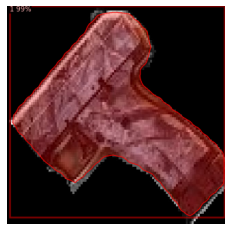

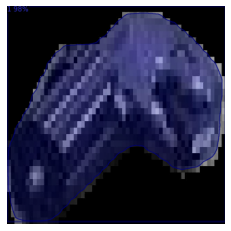

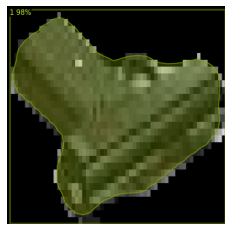

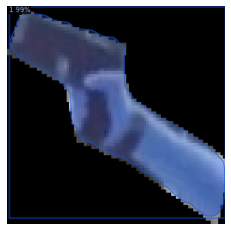

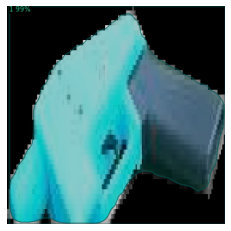

...

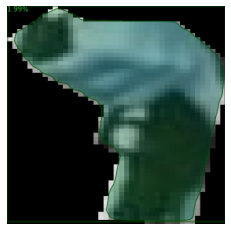

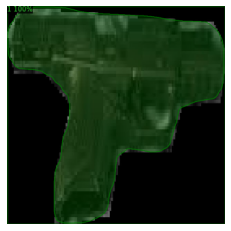

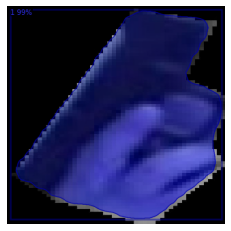

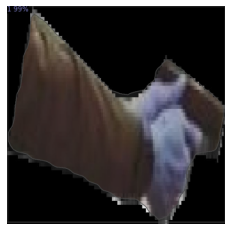

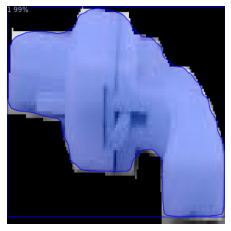

In [19]:
dataset_dicts = DatasetCatalog.get("asl_poly_valid")
for d in random.sample(dataset_dicts, 20):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print(out)
    im = Image.fromarray(out.get_image()[:, :, ::-1])    
    plt.figure()
    plt.axis('off')
    plt.imshow(im) 
    plt.show()

## Evaluación sobre el conjunto de datos de validación

También podemos evaluar su rendimiento utilizando la métrica AP implementada en la API de COCO.

In [16]:
evaluator = COCOEvaluator("asl_poly_valid", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "asl_poly_valid")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[01/03 20:08:15 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [01/03 20:08:15 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 20:08:15 d2.data.datasets.coco]: Loaded 136 images in COCO format from ./Guns-Segmentation-1/valid/_annotations.coco.json
[01/03 20:08:15 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|    guns    | 0            |    gun     | 136          |
|            |              |            |              |
|   total    | 136          |            |              |
[01/03 20:08:15 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/03 20:08:15 d2.data.common]: Serializing the dataset using: <clas

# MontarDrive

In [20]:
import os
from google.colab import drive
ROOT_FOLDER='/content/'
ROOT_DRIVE_FOLDER=ROOT_FOLDER+'drive/'
drive.mount(ROOT_DRIVE_FOLDER)

Mounted at /content/drive/


In [21]:
modelPath = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
modelPath

'./output/model_final.pth'

In [22]:
!cp ./output/model_final.pth  ./output/model_final_segmentaion.pth

In [23]:
!cp --suffix=_v_$(date +"%y-%m-%d--%T")  ./output/model_final_segmentaion.pth /content/drive/MyDrive/tmf-person-data/models/detectron/gun-segmentation